In [2]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import fooof
from fooof import FOOOFGroup
import os 
import joblib
import emd
import re
# import statsmodels.formula.api as smf
# import statsmodels.api as sm

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [4]:
import sys
sys.path.append('/Users/alexandrafink/Documents/GitHub/LFPAnalysis')

In [5]:
from LFPAnalysis import lfp_preprocess_utils, sync_utils, analysis_utils, nlx_utils, davis_utils

In [6]:
#set paths for analysis

#directory of current project 
base_dir = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/'
#data directory - currently original paths
anat_path = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/anat/'
behav_dir = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/behav/'
data_path = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/'
#project dir to store (should be in base_dir)
save_path = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/'



In [7]:
#desired subjects
subj_ids = ['MS002','MS003','MS016','MS017','MS019','MS020','MS022','MS027']
subj_formats = ['edf', 'edf', 'edf', 'edf', 'edf', 'edf','edf','edf']
subj_site = ['MSSM','MSSM','MSSM','MSSM','MSSM','MSSM','MSSM','MSSM']

#dictionaries for data storage
elec_dict = {f'{x}': [] for x in subj_ids}
mne_dict = {f'{x}': [] for x in subj_ids}
photodiode_dict = {f'{x}': [] for x in subj_ids}

#DA8 breaks now with preprocessing and so does MS004

In [7]:
for subj_id in subj_ids: 
    # Set paths
    load_path = base_dir + 'data/ephys/' + subj_id
    save_path = base_dir + 'data/ephys/' + subj_id 

    elec_file = anat_path + subj_id + '_labels.csv'
    elec_data = lfp_preprocess_utils.load_elec(elec_file)

    mne_data_reref = mne.io.read_raw_fif(f'{load_path}/wm_ref_ieeg.fif', preload=True)

    photodiode_data = mne.io.read_raw_fif(f'{load_path}/photodiode.fif', preload=True)

    # Append to list 
    mne_dict[subj_id].append(mne_data_reref)

    photodiode_dict[subj_id].append(photodiode_data)

    elec_dict[subj_id].append(elec_file)

subj_id = 'MS027'
photodiode_dict[subj_id][0]._data = np.abs(photodiode_dict[subj_id][0]._data[0, :]-np.nanmax(photodiode_dict[subj_id][0]._data[0, :]))



/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_1441/3793058824.py:11: RuntimeWarning: This filename (/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/MS002/photodiode.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  photodiode_data = mne.io.read_raw_fif(f'{load_path}/photodiode.fif', preload=True)
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_1441/3793058824.py:11: RuntimeWarning: This filename (/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/MS003/photodiode.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  photodiode_

In [ ]:
temp_df

In [ ]:
#checking average time to choice 
subj_ids = ['MS002','MS003','MS016','MS017','MS019','MS020','MS022','MS027']

for ix, subj_id in enumerate(subj_ids):

    behav_path = behav_dir + subj_id + '_task_data'
    temp_df = pd.read_csv(behav_path, index_col=None, header=0)

    feedback_ts = temp_df['TrialOnset']
    feedback_ts = feedback_ts[~np.isnan(beh_ts)] 


In [8]:
slopes = {f'{x}': [] for x in subj_ids}
offsets = {f'{x}': [] for x in subj_ids}
heights = [0.5,0.75,0.5,0.5,0.5,0.25,0.5,0.5] #predetermined for each subject

for ix,subj_id in enumerate(subj_ids): 
        
    # Load the behavioral timestamps: 

    behav_path = behav_dir + subj_id + '_task_data'
    temp_df = pd.read_csv(behav_path, index_col=None, header=0)
    # Load in the timestamps pertaining to your sync. If your task had a square pop up, for example, grab the times for that square's appearance from the behavioral logs.
    # Below, I do this for my own task's Psychopy output, but yours is probably coded differently. 
    
    beh_ts = temp_df['TrialOnset']
    beh_ts = beh_ts[~np.isnan(beh_ts)] 

    # Synchronize to the photodiode or whatever your neural sync signal is
    try:
        slope, offset = sync_utils.synchronize_data(beh_ts, 
                                                    photodiode_dict[subj_id][0], 
                                                    smoothSize=11, windSize=15, height=heights[ix])
    except IndexError:
        print('If this is failing, mess around with the height parameter - it could be too strict, or too lenient')

    slopes[subj_id].append(slope)
    offsets[subj_id].append(offset)

10 blocks
..........

found matches for 120 of 163 pulses
11 blocks
...........

found matches for 90 of 175 pulses
10 blocks
..........

found matches for 120 of 156 pulses
10 blocks
..........

found matches for 120 of 160 pulses
8 blocks
........

found matches for 100 of 160 pulses
10 blocks
..........

found matches for 120 of 156 pulses
12 blocks
............

found matches for 135 of 186 pulses
9 blocks
.........

found matches for 120 of 186 pulses
10 blocks
..........

found matches for 120 of 163 pulses
10 blocks
..........

found matches for 120 of 160 pulses


In [69]:
# IED removal requires that we set some parameters for IED detection. 
# 1. peak_thresh: how many stds should they exceed the baseline by? 
# 2. closeness_thresh: how close should they be allowed to be (in sec) to other candidate IEDs? 
# 3. width_thresh: how wide should they have to be (in sec)?

# Defaults:
IED_args = {'peak_thresh':4,
           'closeness_thresh':0.25, 
           'width_thresh':0.2}

# Create a dictionary with your event name (matching your dataframe), and the time-window for the event
evs = {'TrialOnset': [-1.0, 0],
       'DecisionOnset': [0, 3.0]} #changed to preceeding 1 second for SWB

# Note: I am treating the baseline events just like ANY OTHER event

# add behavioral times of interest 
for subj_id in subj_ids:
    
    # Filter behavior to the specific subject
    behav_path = behav_dir + subj_id + '_task_data'
    subj_data = pd.read_csv(behav_path, index_col=None, header=0)
    #subj_data = behav_data[behav_data.participant==subj_id] #salman has behavior in one df 
    
    # Set paths
    load_path = base_dir + 'data/ephys/' + subj_id + '/'
    save_path = base_dir + 'data/ephys/' + subj_id + '/'



    epochs_all_evs = {f'{x}': np.nan for x in evs}
    epochs_all_baseline = {f'{x}': np.nan for x in evs}

    for event in evs.keys():
        # Make the epochs. 
        ev_epochs = lfp_preprocess_utils.make_epochs(load_path=f'{load_path}wm_ref_ieeg.fif', #this has correct naming scheme!
                     elec_path=elec_dict[subj_id][0], 
                     slope=slopes[subj_id][0], offset=offsets[subj_id][0],
                     behav_name=event, behav_times=subj_data[event].values, 
                     ev_start_s=evs[event][0], ev_end_s=evs[event][1], buf_s = 1.0, 
                     downsamp_factor=1, IED_args=IED_args)

        epochs_all_evs[event] = ev_epochs
        epochs_all_evs[event].save(f'{save_path}epoch_{event}.fif', overwrite=True) #this has the correct naming scheme still

/Users/alexandrafink/Documents/GitHub/LFPAnalysis/LFPAnalysis/lfp_preprocess_utils.py:1109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = mne_data_reref.ch_names
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 520 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 13130 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 15000 out of 15000 | elapsed:    2.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.9s finished
/var/folders/xk/q5rxx0ld0hn

In [80]:
# Create a dictionary with the name of the events that you want to pull out of your dataframe, and the time associated with them
evs = {'TrialOnset': [-1.0, 0],
       'DecisionOnset': [0, 3.0]}

epochs_all_subjs_all_evs = {f'{a}': {f'{b}': np.nan for b in evs.keys()} for a in subj_ids}

for subj_id in subj_ids:
    # Filter behavior to the specific subject
    behav_path = behav_dir + subj_id + '_task_data'
    subj_data = pd.read_csv(behav_path, index_col=None, header=0)
    load_path = base_dir + 'data/ephys/' + subj_id + '/'

    
    for event in evs.keys():
        
        ev_epochs = mne.read_epochs(f'{load_path}epoch_{event}.fif', preload=True)
        
        epochs_all_subjs_all_evs[subj_id][event] = ev_epochs
        
        # Let's add our behavioral events to the metadata. Substitute this with the particulars for your behavioral dataframe. 

        event_metadata = epochs_all_subjs_all_evs[subj_id][event].metadata.copy()

        event_metadata['ev'] = subj_data['EV'].tolist()
        event_metadata['cr'] = subj_data['CR'].tolist()
        event_metadata['outcome'] = subj_data['Outcome'].tolist()
        event_metadata['rpe'] = subj_data['RPE'].tolist()
        event_metadata['profit'] = subj_data['Profit'].tolist()
        event_metadata['total_cpe'] = subj_data['total_CPE'].tolist()
        event_metadata['decision_cpe'] = subj_data['decision_CPE'].tolist()
        event_metadata['regret'] = subj_data['regret'].tolist()
        event_metadata['relief'] = subj_data['relief'].tolist()

        epochs_all_subjs_all_evs[subj_id][event].metadata = event_metadata 
    

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_10479/1511932818.py:16: RuntimeWarning: This filename (/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/MS002/epoch_TrialOnset.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  ev_epochs = mne.read_epochs(f'{load_path}epoch_{event}.fif', preload=True)
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_10479/1511932818.py:16: RuntimeWarning: This filename (/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys/MS002/epoch_DecisionOnset.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  ev_epochs = mne.read_epochs(f'{load_path}epoch_{event}.fif', preload=True)
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_10479/1511932818.py:16: RuntimeWarning: This filename (/Users/alexandrafin

In [81]:
# Explicitly define a list of analysis events and the baseline event. Should correspond to the dict
analysis_evs = ['DecisionOnset']
baseline_ev = 'TrialOnset'
evs = {'TrialOnset': [-1.0, 0],
       'DecisionOnset': [0, 3.0]}
for i in analysis_evs: 
    if i not in evs.keys(): 
        raise ValueError('This analysis event is not in the dictionary')

In [84]:
# Set some spectrogram parameters 
freqs = np.logspace(*np.log10([4, 200]), num=20)
n_cycles = 4  
sr = 500.0 #prob shouldn't have subject_id in here since not in loop...
buf = 1.0
buf_ix = int(buf*sr)


baseline_power_epochs = {f'{a}': {f'{b}': np.nan for b in evs.keys()} for a in subj_ids}

power_epochs = {f'{a}': {f'{b}': np.nan for b in evs.keys()} for a in subj_ids}

In [1]:
# Compute baseline_power
for subj_id in subj_ids:
    event = 'TrialOnset'
    epochs = epochs_all_subjs_all_evs[subj_id][event]
        
    # Let's make sure we only do this for good channels
    good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
    picks = [x for x in good_chans]

    pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                           epochs._data.shape[1], len(freqs), 
                           epochs._data.shape[-1]])

    for ch_ix in np.arange(epochs._data.shape[1]): 
        ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
        bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0]
        good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
        ch_data = np.delete(ch_data, bad_epochs, axis=0)
        ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                            freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                            use_fft=True, output='power', n_jobs=1)

        pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]

    temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                            epochs.times, freqs)
    temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])

    baseline_power_epochs[subj_id][event] = temp_pow

NameError: name 'subj_ids' is not defined

In [90]:
for subj_id in subj_ids:
    for event in analysis_evs:
                
        epochs = epochs_all_subjs_all_evs[subj_id][event]
            
        # Let's make sure we only do this for good channels
        good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
        picks = [x for x in good_chans]
        
        pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                               epochs._data.shape[1], len(freqs), 
                               epochs._data.shape[-1]])

        for ch_ix in np.arange(epochs._data.shape[1]): 
            ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
            bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0]
            good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
            ch_data = np.delete(ch_data, bad_epochs, axis=0)
            ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                                freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                                use_fft=True, output='power', n_jobs=1)

            pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]
        
        temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                                epochs.times, freqs)
        
        temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])
        
        baseline_corrected_power = lfp_preprocess_utils.zscore_TFR_across_trials(temp_pow.data, 
                                      baseline_power_epochs[subj_id]['TrialOnset'], mode='zscore', baseline_only=False)
        
        zpow = mne.time_frequency.EpochsTFR(epochs.info, baseline_corrected_power, 
                                        temp_pow.times, freqs)
        
        zpow.metadata = epochs_all_subjs_all_evs[subj_id][event].metadata
        
        power_epochs[subj_id][event] = zpow
        

/Users/alexandrafink/Documents/GitHub/LFPAnalysis/LFPAnalysis/lfp_preprocess_utils.py:138: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.nanmean(baseline_data, axis=time_axis), axis=ev_axis)
/Users/alexandrafink/opt/anaconda3/envs/fbi_retreat_2023/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/alexandrafink/Documents/GitHub/LFPAnalysis/LFPAnalysis/lfp_preprocess_utils.py:138: RuntimeWarning: Mean of empty slice
  m = np.nanmean(np.nanmean(baseline_data, axis=time_axis), axis=ev_axis)
/Users/alexandrafink/opt/anaconda3/envs/fbi_retreat_2023/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/alexandrafink/Documents/GitHub/LFPAnalysis/LFPAnalysis/lfp_preprocess_utils.py:138: RuntimeWarning: Mean of empty slice
  m = np.

In [92]:
epochs_dict = epochs_all_subjs_all_evs
baseline_dict = baseline_power_epochs
power_dict = power_epochs

# load pickle module
import pickle
data_path = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys'


# create a binary pickle file 
f = open(f'{data_path}/epochs_epochs.pkl',"wb")

# write the python object (dict) to pickle file
pickle.dump(epochs_dict,f)

# close file
f.close()

# create a binary pickle file 
f = open(f'{data_path}/baseline_epochs.pkl',"wb")

# write the python object (dict) to pickle file
pickle.dump(baseline_dict,f)

# close file
f.close()

# create a binary pickle file 
f = open(f'{data_path}/power_epochs.pkl',"wb")

# write the python object (dict) to pickle file
pickle.dump(power_dict,f)

# close file
f.close()



array([  4.        ,   4.4220467 ,   4.88862426,   5.40443119,
         5.97466178,   6.60505835,   7.30196912,   8.07241211,
         8.92414584,   9.86574741,  10.90669895,  12.05748303,
        13.32968826,  14.73612599,  16.29095933,  18.00984574,
        19.91009473,  22.01084218,  24.33324301,  26.90068424,
        29.7390205 ,  32.87683437,  36.34572423,  40.18062248,
        44.42014726,  49.10699141,  54.28835233,  60.01640733,
        66.348839  ,  73.34941614,  81.08863591,  89.64443371,
        99.10296808, 109.55948825, 121.11929338, 133.89879291,
       148.02667884, 163.64522169, 180.91170315, 200.        ])

In [8]:
import pickle
data_path = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/data/ephys'
epochs_all_subjs_all_evs = pd.read_pickle(rf'{data_path}/epochs_epochs.pkl')
baseline_power_epochs = pd.read_pickle(rf'{data_path}/baseline_epochs.pkl')
power_epochs = pd.read_pickle(rf'{data_path}/power_epochs.pkl')

In [9]:
# Explicitly define a list of analysis events and the baseline event. Should correspond to the dict
analysis_evs = ['DecisionOnset']
baseline_ev = 'TrialOnset'
evs = {'TrialOnset': [-1.0, 0],
       'DecisionOnset': [0, 3.0]}
for i in analysis_evs: 
    if i not in evs.keys(): 
        raise ValueError('This analysis event is not in the dictionary')

In [28]:
# Set some spectrogram parameters 
freqs = np.logspace(*np.log10([4,200]),num=40)
n_cycles = 4  
sr = 500.0 #prob shouldn't have subject_id in here since not in loop...
buf = 1.0
buf_ix = int(buf*sr)



In [24]:
freqs = np.logspace(*np.log10([4, 200]), num=20)


In [129]:
f'{base_dir}figs/final_total_cpe_TFRs/{subj_id}_{region}_{cond_name}.png'

'/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/figs/final_total_cpe_TFRs/MS027_orbital_total_cpe.png'

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/3192211880.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/3192211880.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/3192211880.py:32: SettingWithCopyWarning: 
A value is 

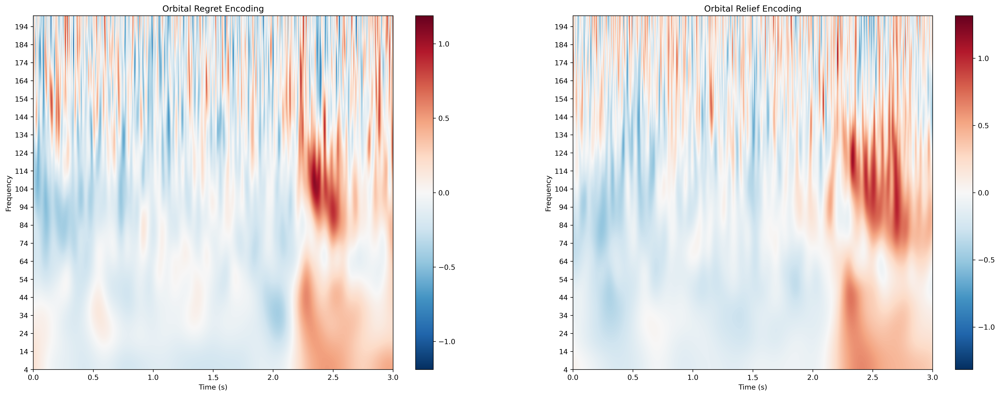

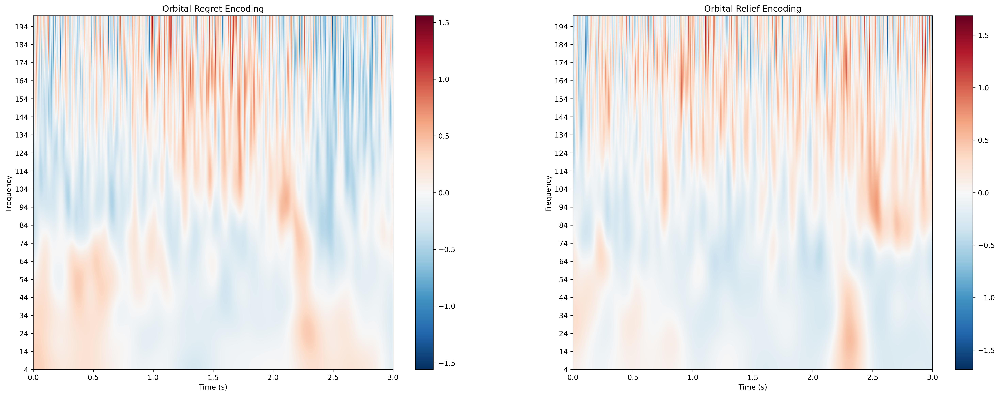

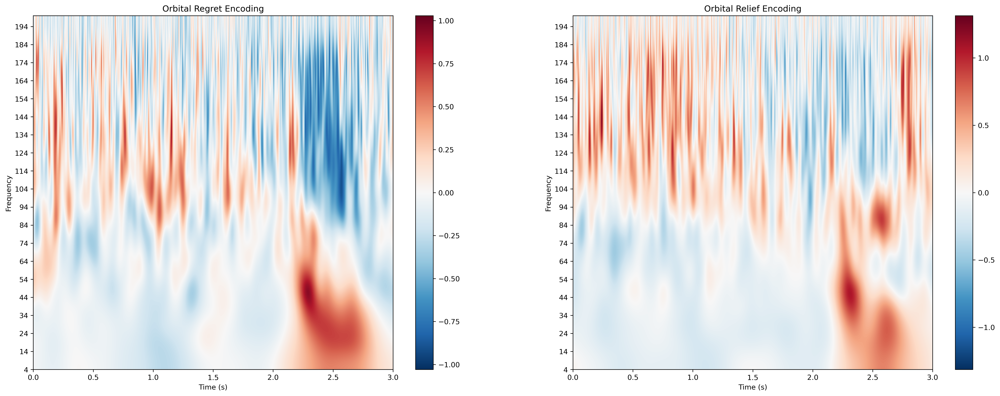

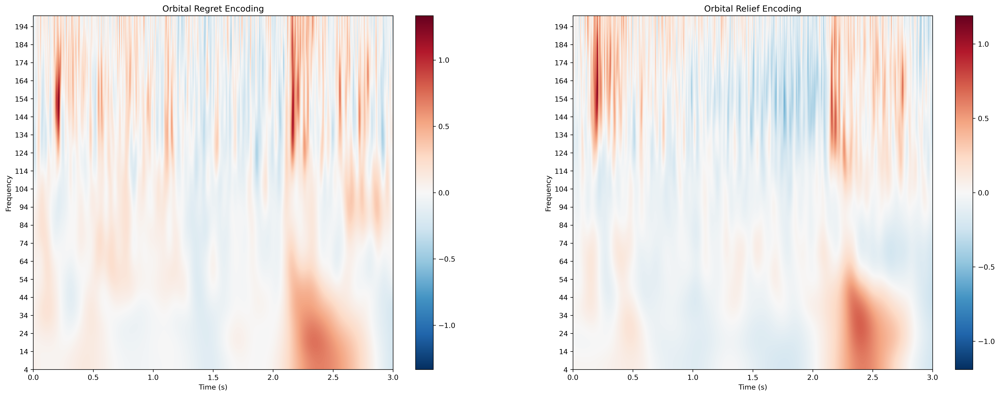

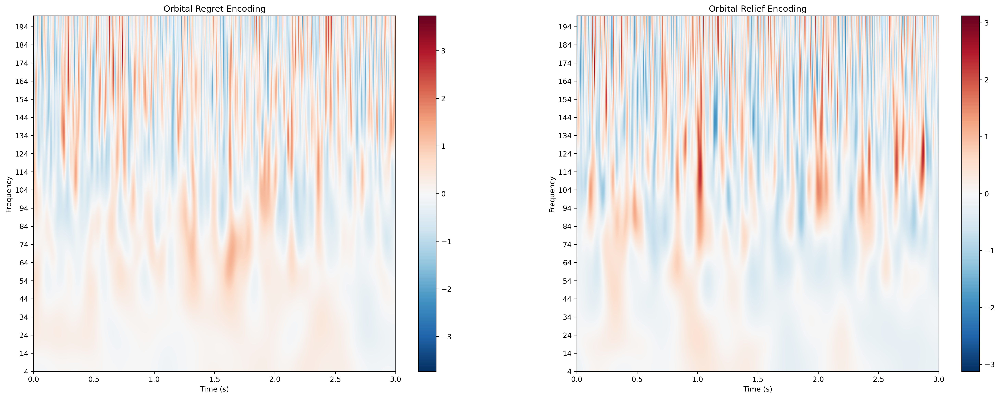

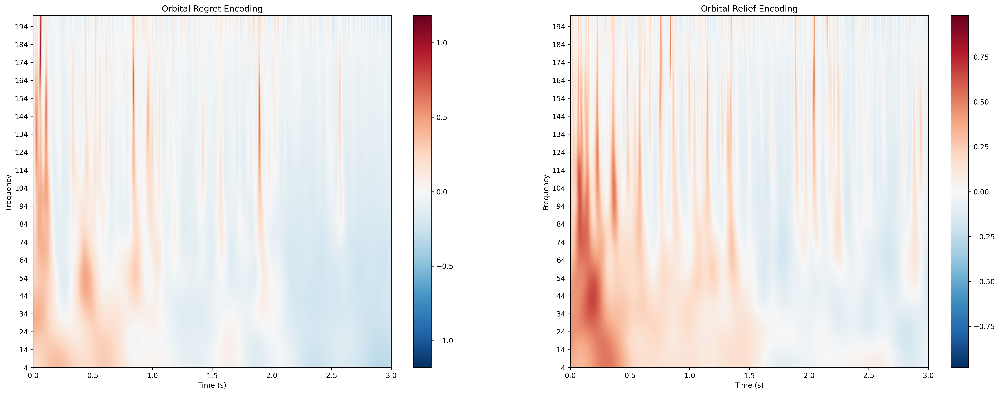

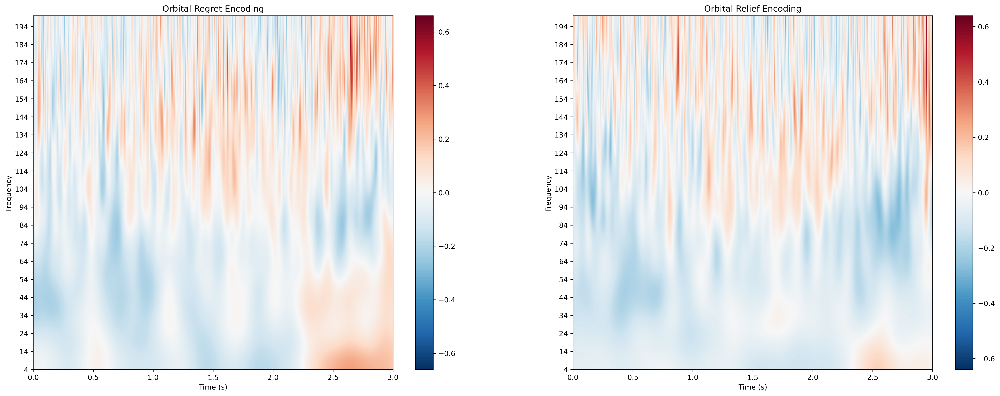

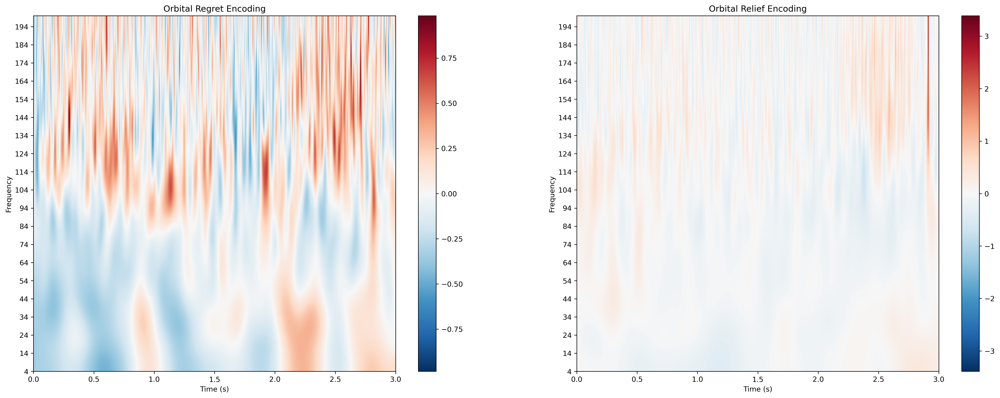

In [128]:
# rois = ['orbital', 'cingulate', 'amygdala', 'insular', 'hippocampus','superior frontal', 'middle frontal', 'inferior frontal']
region = 'orbital'

# band definitions for y-axis
#freqs = np.logspace(*np.log10([4,200]),num=40)
yticks = np.arange(4,200,step=10)

#cond_names = [ev(0,-,+),cr,rpe(0,-,+),profit(0,-,+),total_cpe(-,+),decision_cpe(-,+),regret(-,0),relief(0,+)]
# task condition to contrast 
conditions = ["(total_cpe<0)",
             "(total_cpe>0)"]


cond_name = 'total_cpe'

event = 'DecisionOnset'
for subj_id in subj_ids:
    
    # Get electrode df 
    elec_file = anat_path + subj_id + '_labels.csv'

    elec_data = lfp_preprocess_utils.load_elec(elec_file)

    #elec_data = elec_data.dropna(how='all')
    anode_list = [x.split('-')[0] for x in epochs_all_subjs_all_evs[subj_id][event].ch_names] #having problem here because anode names does not match elec_df!!
    #new_anode_list = lfp_preprocess_utils.match_elec_names(anode_list,elec_data.label)
    elec_df = elec_data[elec_data.label.str.lower().isin(anode_list)]
    #elec_df = elec_data[elec_data.label.str.lower().isin(new_anode_list[0])]

    
    
    elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names

    picks = analysis_utils.select_picks_rois(elec_df, region)
    #print(picks)
    #print(subj_id,len(picks))
    
    for event in analysis_evs:
        fig, ax = plt.subplots(1, 2, figsize=(25, 9), dpi=300)
        for ix, cond in enumerate(conditions):
            plot_title = ['Regret','Relief']
            region_name = region[0].upper() + region[1:]
            # Set the times for 
            times = power_epochs[subj_id][event].times
            plot_data = np.nanmean(np.nanmean(power_epochs[subj_id][event][cond].copy().pick_channels(picks).data, axis=0), axis=0)

            im = ax[ix].imshow(plot_data,
                      extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation='Bicubic',
                      aspect='auto', origin='lower', cmap='RdBu_r',vmin = -np.nanmax(np.abs(plot_data)), vmax = np.nanmax(np.abs(plot_data)))
            ax[ix].set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency',title=f'{region_name} {plot_title[ix]} Encoding')
            fig.colorbar(im, ax=ax[ix])
    plt.savefig(f'{base_dir}figs/final_total_cpe_TFRs/{subj_id}_{region}_{cond_name}.png', dpi='figure', format='png', metadata=None,
        bbox_inches=None, pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None)   


/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/453680992.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

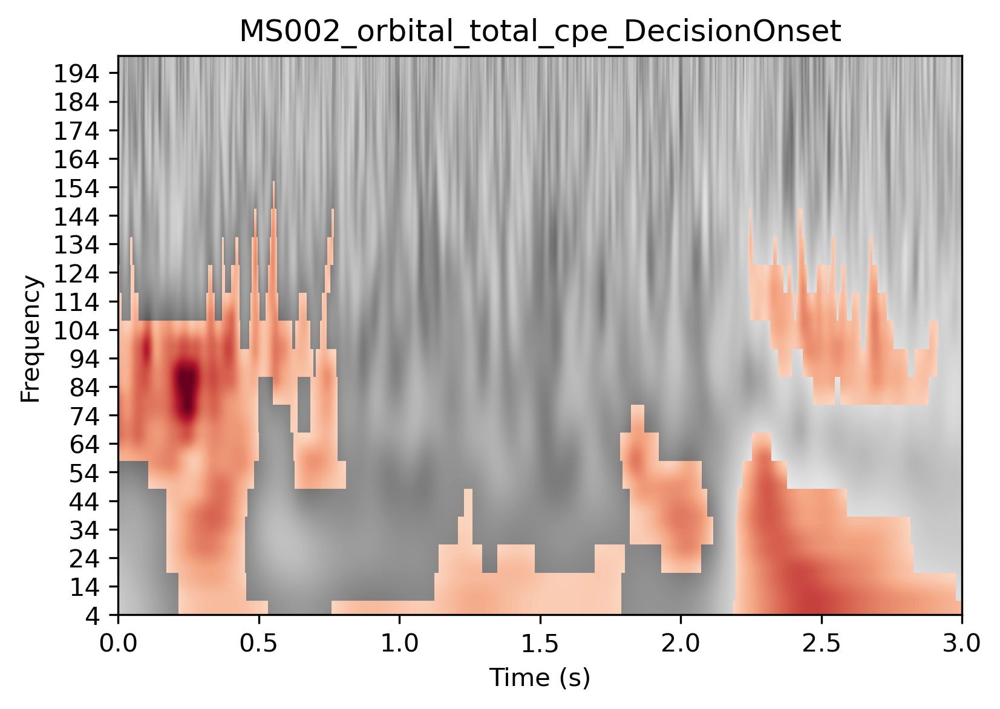

In [81]:
subj_id = 'MS002'
region = 'orbital'
cond_name = 'total_cpe'

conditions = ["(total_cpe<0)",
             "(total_cpe>0)"]

save_path = f'{base_dir}figs/{cond_name}_clusters/{subj_id}_{region}_{cond_name}'

# Get electrode df 
elec_file = anat_path + subj_id + '_labels.csv'

elec_data = lfp_preprocess_utils.load_elec(elec_file)

anode_list = [x.split('-')[0] for x in epochs_all_subjs_all_evs[subj_id][event].ch_names]
elec_df = elec_data[elec_data.label.str.lower().isin(anode_list)]
elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
    
picks = analysis_utils.select_picks_rois(elec_df, region)

for event in analysis_evs:
    
    # Average the data in each condition across channels 
    X = np.nanmean(power_epochs[subj_id][event].copy().pick_channels(picks).data, axis=1)
    
    F_obs, clusters, cluster_p_values, H0 = \
    mne.stats.permutation_cluster_1samp_test(X, n_permutations=500, out_type='mask', verbose=True)
    
    if any(cluster_p_values<=0.05):
#     print(region)
        # Create new stats image with only significant clusters
        fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

        times =  power_epochs[subj_id][event][conditions[1]].times


        # Average the data in each condition across epochs for plotting
        evoked_power = np.nanmean(X, axis=0)
    #     evoked_power_2 = np.nanmean(X[1], axis=0)
    #     evoked_power_contrast = evoked_power_1 - evoked_power_2
        signs = np.sign(evoked_power)

        F_obs_plot = np.nan * np.ones_like(F_obs)
        for c, p_val in zip(clusters, cluster_p_values):
            if p_val <= 0.05:
                F_obs_plot[c] = F_obs[c] * signs[c]

        ax.imshow(F_obs,
                  extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation = 'Bicubic',
                  aspect='auto', origin='lower', cmap='Greys_r')
        max_F = np.nanmax(abs(F_obs_plot))
        ax.imshow(F_obs_plot,
                  extent=[times[0], times[-1], freqs[0], freqs[-1]],
                  aspect='auto', origin='lower', cmap='RdBu_r',
                  vmin=-max_F, vmax=max_F)

        ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id}_{region}_{cond_name}_{event}')

            # # ax.set_title(f'Induced power ({ch_name})')
    
    

In [ ]:
subj_id = 'MS002'
region = 'frontal'

conditions = ["(total_cpe<0)",
             "(total_cpe>0)"]
cond_name = 'total_cpe'


save_path = f'{base_dir}figs/region_two_sammple_clust/{subj_id}_{region}_{cond_name}'

elec_file = anat_path + subj_id + '_labels.csv'

elec_data = lfp_preprocess_utils.load_elec(elec_file)

anode_list = [x.split('-')[0] for x in epochs_all_subjs_all_evs[subj_id][event].ch_names]
elec_df = elec_data[elec_data.label.str.lower().isin(anode_list)]
elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
    
picks = analysis_utils.select_picks_rois(elec_df, region)



for event in analysis_evs:
    
    # Average the data in each condition across channels 
    X = [np.nanmean(power_epochs[subj_id][event][conditions[0]].copy().pick_channels(picks).data, axis=1), 
         np.nanmean(power_epochs[subj_id][event][conditions[1]].copy().pick_channels(picks).data, axis=1)]
    
    F_obs, clusters, cluster_p_values, H0 = \
    mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)
    
    if any(cluster_p_values<=0.05):
        # Create new stats image with only significant clusters
        fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

        times =  power_epochs[subj_id][event][conditions[0]].times


        # Average the data in each condition across epochs for plotting
        evoked_power_1 = np.nanmean(X[0], axis=0)
        evoked_power_2 = np.nanmean(X[1], axis=0)
        evoked_power_contrast = evoked_power_1 - evoked_power_2
        signs = np.sign(evoked_power_contrast)

        F_obs_plot = np.nan * np.ones_like(F_obs)
        for c, p_val in zip(clusters, cluster_p_values):
            if p_val <= 0.05:
                F_obs_plot[c] = F_obs[c] * signs[c]

        ax.imshow(F_obs,
                  extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation = 'Bicubic',
                  aspect='auto', origin='lower', cmap='gray')
        max_F = np.nanmax(abs(F_obs_plot))
        ax.imshow(F_obs_plot,
                  extent=[times[0], times[-1], freqs[0], freqs[-1]],
                  aspect='auto', origin='lower', cmap='RdBu_r',
                  vmin=-max_F, vmax=max_F)

        ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id}_{region}_{cond_name}_{event}')

        # # ax.set_title(f'Induced power ({ch_name})')
    
    

# one sample cluster permutation test

In [163]:
subj_ids = ['MS002','MS003','MS016','MS017']

#parsing single electrode data
ms002_orbital_elecs = ['rmoif1-racas5', 'rmoif2-racas5', 'rmoif3-raims7', 'rmoif6-raims7', 'rmoif7-raims7'] #right frontal orbital 4C and 4D
ms002_cingulate_elecs = ['lacas1-lmoif6', 'lacas2-lmoif3', 'lacas3-lmoif7', 'lacas4-lmoif5', 'lacas5-lmoif6', 'racas1-raims7', 'racas2-raims7', 'racas6-raims9']  #left acc and right area 33
ms002_insula_elecs = ['laims1-lmoif8', 'laims2-lmoif8', 'laims4-laims7', 'laims5-laims7', 'lpips1-lpips3', 'lpips2-lpips5', 'lpips4-lpips5', 'raims1-ragit5', 'raims2-ragit5', 'raims4-raims8', 'raims5-raims8'] 

ms003_orbital_elecs = ['lmolf2-lmolf1', 'lmolf3-lmolf1', 'lmolf4-lmolf6', 'lmolf5-lmolf6', 'lmolf7-lmolf6', 'lmolf8-lmolf6', 'rmolf1-rmolf2', 'rmolf3-rmolf2'] #left 4CD right ob 5 ACD
ms003_cingulate_elecs = ['lacas2-lmolf1', 'lacas3-lmolf1', 'lacas4-lacas8', 'lacas5-lacas8', 'lmcms3-lmcms2', 'racas2-rmolf5', 'racas3-rmolf5', 'racas4-racas9', 'racas5-rmolf2', 'rmcms1-rmcms5', 'rmcms3-rmcms2'] #both 1 and 2 are area 32 ant
ms003_insula_elecs = ['laimm1-laglt5', 'laimm2-laglt5', 'laimm3-lmolf6', 'laimm4-lsifo1', 'lsifo2-lsifo1', 'raimm1-rmolf5', 'raimm2-rmolf8', 'raimm3-rmolf5', 'raimm4-rmolf8', 'rsifo2-rsifo5'] 

ms016_orbital_elecs = ['lmolf2-lacas3', 'lmolf3-lacas2', 'lmolf4-lacas4', 'lmolf5-lacas3', 'lmolf6-lacas5'] #2C 3CD
ms016_cingulate_elecs = ['lacas1-lacas3', 'lmcms3-lmcms2', 'racas1-racas6', 'racas2-racas6'] #r/l 1 = 24 lm 33

ms017_orbital_elecs = ['lmolf2-lalps4', 'lmolf4-lalps4'] #2C2D
ms017_cingulate_elecs = ['lacas2-lmolf1', 'lacas3-lmolf1', 'lacas4-lacas8', 'lacas5-lacas8', 'lmcms3-lmcms2'] #l1 = 24 l2=33
ms017_insula_elecs = ['lalps2-lalps6'] 

#final_picks = [ch for ch in epochs_all_subjs_all_evs['MS017']['DecisionOnset'].ch_names if((picks[0] in ch) or (picks[1] in ch))]


In [58]:
f'{base_dir}figs/{cond_name}_clusters/{subj_id}_{region}_{cond_name}'

'/Users/alexandrafink/Documents/GraduateSchool/SaezLab/fbi_retreat_poster_2023/figs/profit_TFRs/MS027_insular_profit.png'

In [167]:
###### single electrode cluster permutation

subj_id = 'MS017'
cond_name = 'total_cpe'
elec_list = ms017_insula_elecs
event = 'DecisionOnset'

conditions = ["(total_cpe<0)",
             "(total_cpe>0)"]

#save_path = f'{base_dir}figs/{cond_name}_clusters/{subj_id}_{region}_{cond_name}'

  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

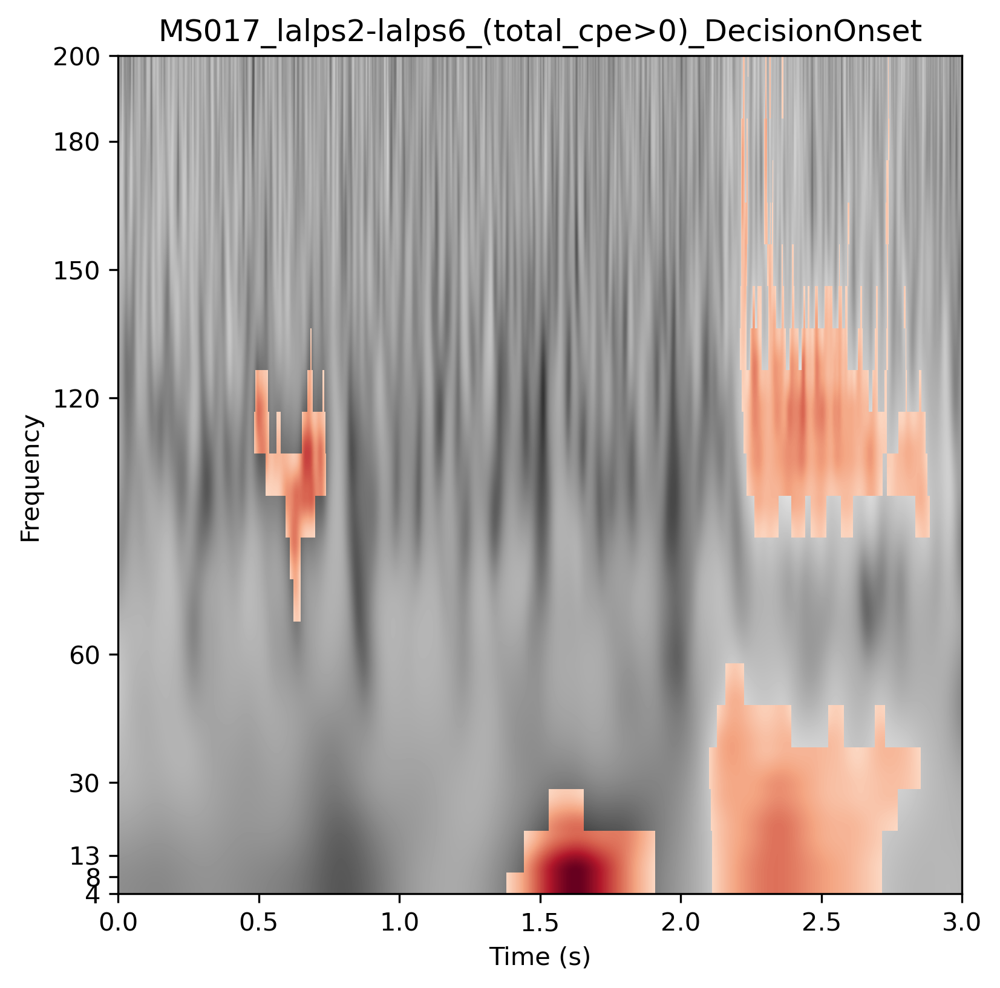

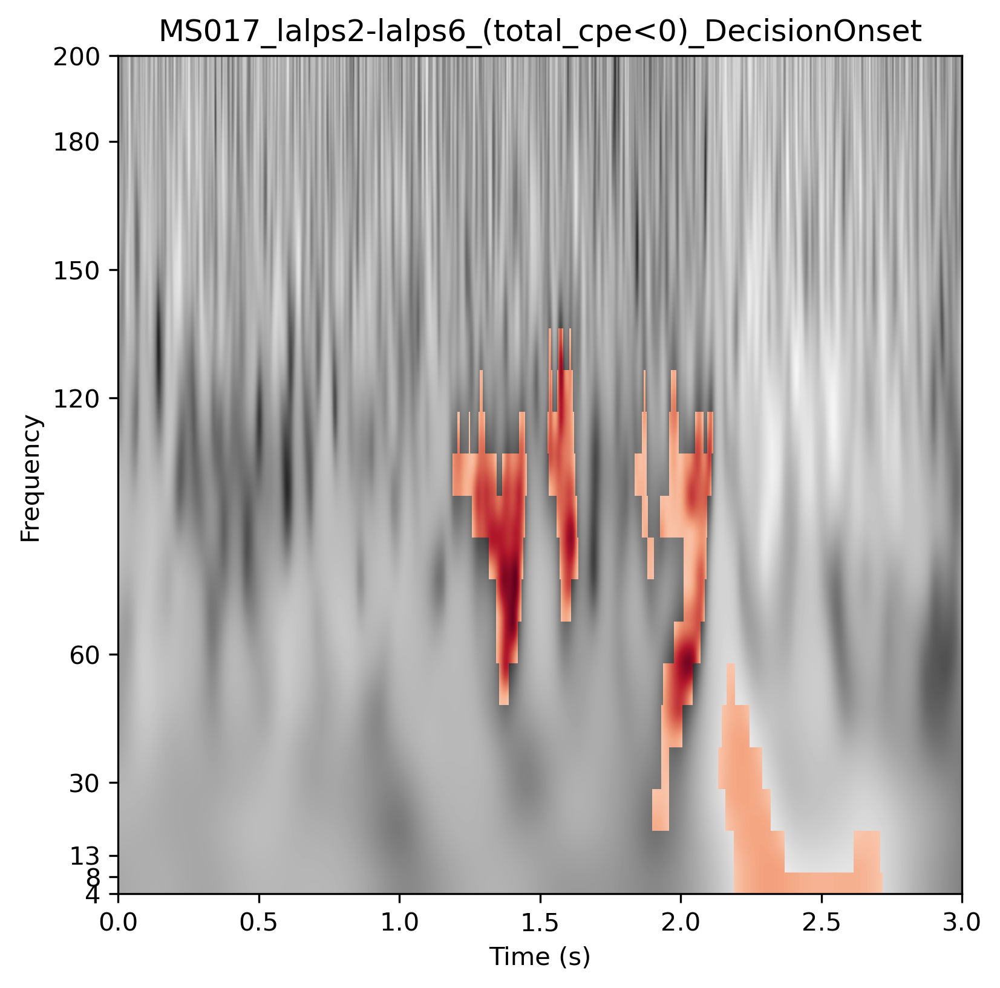

In [168]:
for elec in elec_list:
    
    for c in conditions:
        cond = c
        # Average the data in each condition across channels 
        X = np.nanmean(power_epochs[subj_id][event][cond].copy().pick_channels([elec]).data, axis=1)

        F_obs, clusters, cluster_p_values, H0 = \
        mne.stats.permutation_cluster_1samp_test(X, n_permutations=500, out_type='mask', verbose=True)
        if any(cluster_p_values<=0.05):
        #     print(region)
            # Create new stats image with only significant clusters
            fig, ax = plt.subplots(1, 1, figsize=(6, 6), dpi=300)

            times =  power_epochs[subj_id][event][cond].times

            # Average the data in each condition across epochs for plotting
            evoked_power = np.nanmean(X, axis=0)
        #     evoked_power_2 = np.nanmean(X[1], axis=0)
        #     evoked_power_contrast = evoked_power_1 - evoked_power_2
            signs = np.sign(evoked_power)

            F_obs_plot = np.nan * np.ones_like(F_obs)
            for c, p_val in zip(clusters, cluster_p_values):
                if p_val <= 0.05:
                    F_obs_plot[c] = F_obs[c] * signs[c]

            ax.imshow(F_obs,
                        extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation = 'Bicubic',
                        aspect='auto', origin='lower', cmap='gray')
            max_F = np.nanmax(abs(F_obs_plot))
            ax.imshow(F_obs_plot,
                        extent=[times[0], times[-1], freqs[0], freqs[-1]],
                        aspect='auto', origin='lower', cmap='RdBu_r',
                        vmin=-max_F, vmax=max_F)

            ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id}_{elec}_{cond}_{event}')

            plt.savefig(f'{base_dir}figs/one_sample_clust/{subj_id}_{elec}_{cond}.png', dpi='figure', format='png', metadata=None,
            bbox_inches=None, pad_inches=0.1,
            facecolor='auto', edgecolor='auto',
            backend=None)  

    


https://matplotlib.org/stable/tutorials/colors/colormaps.html

A two sample cluster permutation test compares the spectrograms between two different task conditions. As an example, let's say I want to compare the positive RPE vs. negative RPE conditions for every channel.

In [126]:
conditions = ["(total_cpe>0)",
                "(total_cpe<0)"] #relief
cond_name = 'total_cpe'
yticks = np.arange(4,200,step=10)
region = 'inferior frontal'





/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2185/2002332973.py:25: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)


  0%|          | Permuting : 0/499 [00:00<?,       ?it/s]

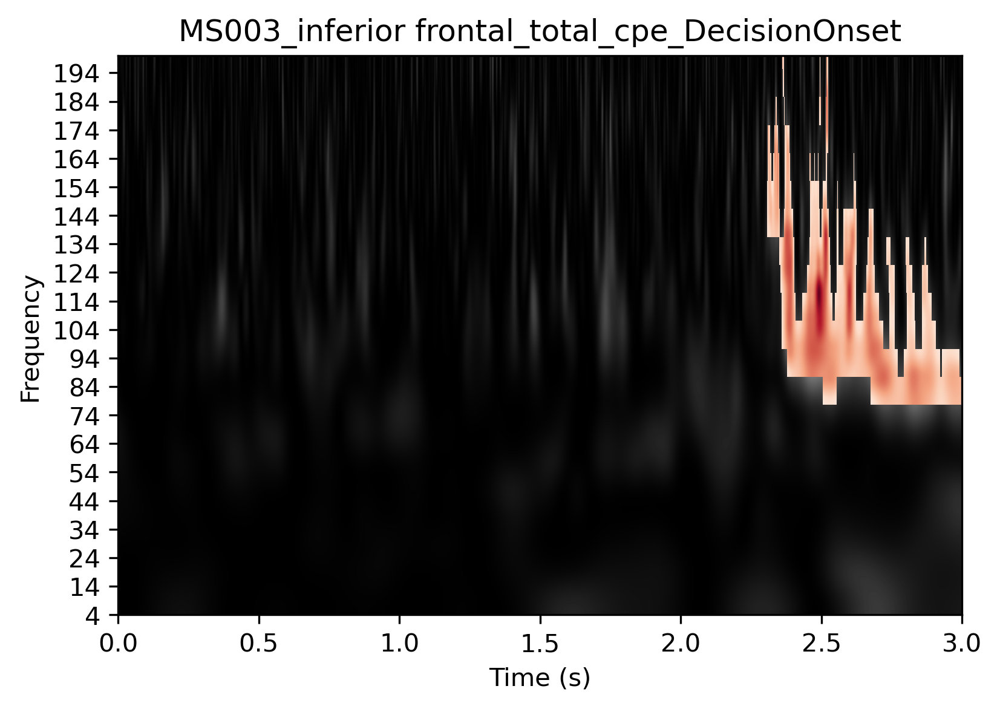

In [127]:
subj_ids = ['MS002','MS003','MS016','MS017','MS019','MS020','MS022','MS027']

for subj_id in subj_ids:

    save_path = f'{base_dir}figs/region_two_sammple_clust/{subj_id}_{region}_{cond_name}'

    elec_file = anat_path + subj_id + '_labels.csv'

    elec_data = lfp_preprocess_utils.load_elec(elec_file)

    anode_list = [x.split('-')[0] for x in epochs_all_subjs_all_evs[subj_id][event].ch_names]
    elec_df = elec_data[elec_data.label.str.lower().isin(anode_list)]
    elec_df['label'] = epochs_all_subjs_all_evs[subj_id][event].ch_names
        
    picks = analysis_utils.select_picks_rois(elec_df, region)


    for event in analysis_evs:
        
        # Average the data in each condition across channels 
        X = [np.nanmean(power_epochs[subj_id][event][conditions[0]].copy().pick_channels(picks).data, axis=1), 
            np.nanmean(power_epochs[subj_id][event][conditions[1]].copy().pick_channels(picks).data, axis=1)]
        
        F_obs, clusters, cluster_p_values, H0 = \
        mne.stats.permutation_cluster_test(X, n_permutations=500, out_type='mask', verbose=True)
        
        if any(cluster_p_values<=0.05):
            # Create new stats image with only significant clusters
            fig, ax = plt.subplots(1, 1, figsize=(6, 4), dpi=300)

            times =  power_epochs[subj_id][event][conditions[0]].times


            # Average the data in each condition across epochs for plotting
            evoked_power_1 = np.nanmean(X[0], axis=0)
            evoked_power_2 = np.nanmean(X[1], axis=0)
            evoked_power_contrast = evoked_power_1 - evoked_power_2
            signs = np.sign(evoked_power_contrast)

            F_obs_plot = np.nan * np.ones_like(F_obs)
            for c, p_val in zip(clusters, cluster_p_values):
                if p_val <= 0.05:
                    F_obs_plot[c] = F_obs[c] * signs[c]

            ax.imshow(F_obs,
                    extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation = 'Bicubic',
                    aspect='auto', origin='lower', cmap='gray')
            max_F = np.nanmax(abs(F_obs_plot))
            ax.imshow(F_obs_plot,
                    extent=[times[0], times[-1], freqs[0], freqs[-1]],
                    aspect='auto', origin='lower', cmap='RdBu_r',
                    vmin=-max_F, vmax=max_F)

            ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency', title=f'{subj_id}_{region}_{cond_name}_{event}')
            
            plt.savefig('f{save_path}.png', dpi='figure', format='png', metadata=None,
                        bbox_inches=None, pad_inches=0.1,facecolor='auto', edgecolor='auto',backend=None)  

            # # ax.set_title(f'Induced power ({ch_name})')
        
            
        